In [ ]:
from __future__ import print_function, unicode_literals, absolute_import, division
import numpy as np

import pandas as pd
import os
import matplotlib.pyplot as plt
from collections import defaultdict
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


import skimage
from skimage import external
from skimage.external import tifffile
from skimage import data, img_as_float
from skimage import exposure
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.measure import compare_ssim as ssim

from tifffile import imread
from csbdeep.utils import Path, download_and_extract_zip_file, axes_dict, plot_some, plot_history
from csbdeep.io import load_training_data, save_tiff_imagej_compatible
from csbdeep.utils.tf import limit_gpu_memory
from csbdeep.models import Config, CARE

from get_data_splits import get_model_data_splits

import cv2
from skimage import img_as_ubyte, io

In [ ]:
#import training data --> update for all channels
#use GPUs

folder_path = '/gpfs/data/lionnetlab/cellvision/pilotdata/20181009-top50'

#channel 1 --> 0
#channel 2 --> 1
#channel 3 --> 2
#channel 4 --> 3
#channel 5 --> 4

training_sets = []
testing_sets = []
val_sets = []

for i in range(1,6):
    train, test, val = get_model_data_splits(folder_path, \
                                  channel = i, \
                                  train_pp = .6, \
                                  test_pp = .2, \
                                  val_pp = .2, \
                                  seed = 1)
    training_sets.append(train)
    testing_sets.append(test)
    val_sets.append(val)

In [3]:
#read in X train for each channel
X_TRAINING_SETS = []
for c in range(0,5):
    X = []
    for i in range(0,len(training_sets[c])):
        entry = skimage.external.tifffile.imread(training_sets[c][i][0])
        X.append(entry)
    X = np.array(X)
    X_TRAINING_SETS.append(X)

#read in X val for each channel
X_VALIDATION_SETS = []
for c in range(0,5):  
    X_val = []
    for i in range(0,len(val_sets[c])):
        entry = skimage.external.tifffile.imread(val_sets[c][i][0])
        X_val.append(entry)
    X_val = np.array(X_val)
    X_VALIDATION_SETS.append(X_val)

#read in X test for each channel
X_TEST_SETS = []
for c in range(0,5):
    X_test = []
    for i in range(0,len(testing_sets[c])):
        entry = skimage.external.tifffile.imread(testing_sets[c][i][0])
        X_test.append(entry)
    X_test = np.array(X_test)
    X_TEST_SETS.append(X_test)

In [4]:
#read in Y train for each channel
Y_TRAINING_SETS = []
for c in range(0,5):
    Y = []
    for i in range(0,len(training_sets[c])):
        entry = skimage.external.tifffile.imread(training_sets[c][i][1])
        Y.append(entry)
    Y = np.array(Y)
    Y_TRAINING_SETS.append(Y)

#read in Y val for each channel
Y_VALIDATION_SETS = []
for c in range(0,5):  
    Y_val = []
    for i in range(0,len(val_sets[c])):
        entry = skimage.external.tifffile.imread(val_sets[c][i][1])
        Y_val.append(entry)
    Y_val = np.array(Y_val)
    Y_VALIDATION_SETS.append(Y_val)

#read in Y test for each channel
Y_TEST_SETS = []
for c in range(0,5):
    Y_test = []
    for i in range(0,len(testing_sets[c])):
        entry = skimage.external.tifffile.imread(testing_sets[c][i][1])
        Y_test.append(entry)
    Y_test = np.array(Y_test)
    Y_TEST_SETS.append(Y_test)

In [7]:
#DO NOT RUN 
#find new exposure scale

#create joint stack
TEMP_IMGS = []
for c in range(0,5):
    CHANNEL_IMGS = np.vstack((
        X_TRAINING_SETS[c],
        X_VALIDATION_SETS[c],
        X_TEST_SETS[c],
        Y_TRAINING_SETS[c],
        Y_VALIDATION_SETS[c],
        Y_TEST_SETS[c]))
    TEMP_IMGS.append(CHANNEL_IMGS)

ALL_IMGS = np.vstack((TEMP_IMGS[0],TEMP_IMGS[1],TEMP_IMGS[2],TEMP_IMGS[3],TEMP_IMGS[4]))

#find minimum intensity
for i in range(0,len(ALL_IMGS)):
    if i == 0:
        stack_min = ALL_IMGS[i].min()
        
    else:
        if ALL_IMGS[i].min() < stack_min:
            stack_min = ALL_IMGS[i].min()
        else: 
            stack_min = stack_min

#find maximum instensity
for i in range(0,len(ALL_IMGS)):
    if i == 0:
        stack_max = ALL_IMGS[i].max()
        
    else:
        if ALL_IMGS[i].max() > stack_max:
            stack_max = ALL_IMGS[i].max()
        else: 
            stack_max = stack_max

In [7]:
#Reload from history (see below)
stack_max = 49222
stack_min = 65

In [6]:
#rescale exposure intensity for all images 
#resize images --> 512 to 128 

#X train
X_TRAIN_ALL_C = []
for c in range(0,5):
    X_TRAIN = []
    for i in range(0,len(X_TRAINING_SETS[c])):
        image = exposure.rescale_intensity(X_TRAINING_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        X_TRAIN.append(image)
    X_TRAIN = np.array(X_TRAIN)
    X_TRAIN_ALL_C.append(X_TRAIN)
    
    
#X val
X_VAL_ALL_C = []
for c in range(0,5):
    X_VAL = []
    for i in range(0,len(X_VALIDATION_SETS[c])):
        image = exposure.rescale_intensity(X_VALIDATION_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        X_VAL.append(image)
    X_VAL = np.array(X_VAL)
    X_VAL_ALL_C.append(X_VAL)




In [7]:
#rescale exposure intensity for all images 
#resize images --> 512 to 128 

#Y train
Y_TRAIN_ALL_C = []
for c in range(0,5):
    Y_TRAIN = []
    for i in range(0,len(Y_TRAINING_SETS[c])):
        image = exposure.rescale_intensity(Y_TRAINING_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        Y_TRAIN.append(image)
    Y_TRAIN = np.array(Y_TRAIN)
    Y_TRAIN_ALL_C.append(Y_TRAIN)
    
    
#Y val
Y_VAL_ALL_C = []
for c in range(0,5):
    Y_VAL = []
    for i in range(0,len(Y_VALIDATION_SETS[c])):
        image = exposure.rescale_intensity(Y_VALIDATION_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        Y_VAL.append(image)
    Y_VAL = np.array(Y_VAL)
    Y_VAL_ALL_C.append(Y_VAL)

In [8]:
print(X_TRAIN_ALL_C[0].shape)
print(X_VAL_ALL_C[0].shape)
#print(X_TEST_ALL_C[0].shape)
print(Y_TRAIN_ALL_C[0].shape)
print(Y_VAL_ALL_C[0].shape)
#print(Y_TEST_ALL_C[0].shape)

(3931, 512, 512)
(1383, 512, 512)
(3931, 512, 512)
(1383, 512, 512)


In [9]:
#reshape X and Y --> (3886, 128, 128) to (3886, 128, 128, 1)

for c in range(0,5):
    X_TRAIN_ALL_C[c] = X_TRAIN_ALL_C[c].reshape(len(X_TRAIN_ALL_C[c]),512,512,1)
    X_VAL_ALL_C[c] = X_VAL_ALL_C[c].reshape(len(X_VAL_ALL_C[c]), 512, 512,1)
    Y_TRAIN_ALL_C[c] = Y_TRAIN_ALL_C[c].reshape(len(Y_TRAIN_ALL_C[c]), 512, 512,1)
    Y_VAL_ALL_C[c] = Y_VAL_ALL_C[c].reshape(len(Y_VAL_ALL_C[c]), 512, 512,1)


In [12]:
print(stack_max)
print(stack_min)

49222
65


In [ ]:
stack_max = 49222
stack_min = 65

In [10]:
#Image Axes
#X: columns, Y: rows, Z: planes, C: channels, T: frames/time, (S: samples/images)
axes = 'SYXC'
c = axes_dict(axes)['C']

n_channel_in_1,n_channel_out_1 = X_TRAIN_ALL_C[0].shape[c], Y_TRAIN_ALL_C[0].shape[c]
n_channel_in_2,n_channel_out_2 = X_TRAIN_ALL_C[1].shape[c], Y_TRAIN_ALL_C[1].shape[c]
n_channel_in_3,n_channel_out_3 = X_TRAIN_ALL_C[2].shape[c], Y_TRAIN_ALL_C[2].shape[c]
n_channel_in_4,n_channel_out_4 = X_TRAIN_ALL_C[3].shape[c], Y_TRAIN_ALL_C[3].shape[c]
n_channel_in_5,n_channel_out_5 = X_TRAIN_ALL_C[4].shape[c], Y_TRAIN_ALL_C[4].shape[c]

In [11]:
#set config files
config_1 = Config(axes, n_channel_in_1, n_channel_out_1, probabilistic=True, train_steps_per_epoch=30)
config_2 = Config(axes, n_channel_in_2, n_channel_out_2, probabilistic=True, train_steps_per_epoch=30)
config_3 = Config(axes, n_channel_in_3, n_channel_out_3, probabilistic=True, train_steps_per_epoch=30)
config_4 = Config(axes, n_channel_in_4, n_channel_out_4, probabilistic=True, train_steps_per_epoch=30)
config_5 = Config(axes, n_channel_in_5, n_channel_out_5, probabilistic=True, train_steps_per_epoch=30)


print(config_1)
vars(config_1)

Config(axes='YXC', n_channel_in=1, n_channel_out=1, n_dim=2, probabilistic=True, train_batch_size=16, train_checkpoint='weights_best.h5', train_epochs=100, train_learning_rate=0.0004, train_loss='laplace', train_reduce_lr={'factor': 0.5, 'patience': 10}, train_steps_per_epoch=30, train_tensorboard=True, unet_input_shape=(None, None, 1), unet_kern_size=5, unet_last_activation='linear', unet_n_depth=2, unet_n_first=32, unet_residual=True)


{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 1,
 'probabilistic': True,
 'unet_residual': True,
 'unet_n_depth': 2,
 'unet_kern_size': 5,
 'unet_n_first': 32,
 'unet_last_activation': 'linear',
 'unet_input_shape': (None, None, 1),
 'train_loss': 'laplace',
 'train_epochs': 100,
 'train_steps_per_epoch': 30,
 'train_learning_rate': 0.0004,
 'train_batch_size': 16,
 'train_tensorboard': True,
 'train_checkpoint': 'weights_best.h5',
 'train_reduce_lr': {'factor': 0.5, 'patience': 10}}

In [12]:
#config model
hn_model_1 = CARE(config_1, 'hn_model_1', basedir='models')
hn_model_2 = CARE(config_2, 'hn_model_2', basedir='models')
hn_model_3 = CARE(config_3, 'hn_model_3', basedir='models')
hn_model_4 = CARE(config_4, 'hn_model_4', basedir='models')
hn_model_5 = CARE(config_5, 'hn_model_5', basedir='models')



In [13]:
#history channel 1
hn_history_1 = hn_model_1.train(X_TRAIN_ALL_C[0],Y_TRAIN_ALL_C[0], \
                                validation_data=(X_VAL_ALL_C[0],Y_VAL_ALL_C[0]))

Epoch 1/100
30/30 [==============================] - 33s 1s/step - loss: 82017.0586 - mse: 21545989.9333 - mae: 3732.8282 - val_loss: 10.0045 - val_mse: 15622544.3030 - val_mae: 3114.3088
Epoch 2/100
30/30 [==============================] - 26s 881ms/step - loss: 9.3041 - mse: 8976291.7833 - mae: 2166.6287 - val_loss: 8.7298 - val_mse: 4118328.9226 - val_mae: 1268.4150
Epoch 3/100
30/30 [==============================] - 30s 997ms/step - loss: 8.3819 - mse: 2223307.8520 - mae: 909.3421 - val_loss: 8.2835 - val_mse: 2486246.0704 - val_mae: 929.4906
Epoch 4/100
30/30 [==============================] - 26s 878ms/step - loss: 8.1904 - mse: 1546976.5896 - mae: 768.4668 - val_loss: 8.1958 - val_mse: 1724887.3547 - val_mae: 793.0817
Epoch 5/100
30/30 [==============================] - 26s 881ms/step - loss: 8.1403 - mse: 1460856.3750 - mae: 738.5549 - val_loss: 8.0515 - val_mse: 1429739.8350 - val_mae: 702.7722
Epoch 6/100
30/30 [==============================] - 26s 880ms/step - loss: 8.0835

Epoch 46/100
30/30 [==============================] - 26s 876ms/step - loss: 7.5287 - mse: 417432.1615 - mae: 420.3802 - val_loss: 7.4581 - val_mse: 485803.0892 - val_mae: 414.1100
Epoch 47/100
30/30 [==============================] - 26s 871ms/step - loss: 7.4938 - mse: 414011.7250 - mae: 410.6987 - val_loss: 7.5410 - val_mse: 410488.3525 - val_mae: 421.2096
Epoch 48/100
30/30 [==============================] - 26s 871ms/step - loss: 7.5848 - mse: 469304.8938 - mae: 442.1137 - val_loss: 7.4572 - val_mse: 459639.1481 - val_mae: 407.9948
Epoch 49/100
30/30 [==============================] - 26s 869ms/step - loss: 7.5377 - mse: 426617.2552 - mae: 421.7904 - val_loss: 7.4397 - val_mse: 449378.6271 - val_mae: 403.6061
Epoch 50/100
30/30 [==============================] - 26s 870ms/step - loss: 7.5012 - mse: 410226.3344 - mae: 412.4593 - val_loss: 7.4548 - val_mse: 441944.7653 - val_mae: 404.1891
Epoch 51/100
30/30 [==============================] - 26s 871ms/step - loss: 7.4716 - mse: 3894

In [14]:
#history channel 2
hn_history_2 = hn_model_2.train(X_TRAIN_ALL_C[1],Y_TRAIN_ALL_C[1], \
                                validation_data=(X_VAL_ALL_C[1],Y_VAL_ALL_C[1]))

Epoch 1/100
30/30 [==============================] - 27s 910ms/step - loss: 361709.1971 - mse: 106324996638.4438 - mae: 208310.3192 - val_loss: 14.9934 - val_mse: 410094348094.0101 - val_mae: 571294.6443
Epoch 2/100
30/30 [==============================] - 26s 871ms/step - loss: 14.1501 - mse: 239558867022.9333 - mae: 381409.6667 - val_loss: 9.8565 - val_mse: 6179268.2726 - val_mae: 2371.4045
Epoch 3/100
30/30 [==============================] - 26s 867ms/step - loss: 8.4609 - mse: 1167485.3219 - mae: 744.7589 - val_loss: 8.2505 - val_mse: 1070044.3760 - val_mae: 715.8981
Epoch 4/100
30/30 [==============================] - 26s 868ms/step - loss: 8.1258 - mse: 1094347.3021 - mae: 677.5433 - val_loss: 8.1394 - val_mse: 1338541.5468 - val_mae: 723.7099
Epoch 5/100
30/30 [==============================] - 26s 867ms/step - loss: 8.1304 - mse: 1425233.0042 - mae: 738.7588 - val_loss: 8.1315 - val_mse: 1324886.5713 - val_mae: 718.6784
Epoch 6/100
30/30 [==============================] - 26s 8

30/30 [==============================] - 26s 864ms/step - loss: 8.1092 - mse: 1469372.1458 - mae: 734.8893 - val_loss: 8.1002 - val_mse: 1457194.5053 - val_mae: 732.8603
Epoch 91/100
30/30 [==============================] - 26s 865ms/step - loss: 8.0761 - mse: 1261005.6000 - mae: 697.4588 - val_loss: 8.0921 - val_mse: 1500532.6145 - val_mae: 738.0801
Epoch 92/100
30/30 [==============================] - 26s 864ms/step - loss: 8.0533 - mse: 1151213.7917 - mae: 672.6558 - val_loss: 8.0970 - val_mse: 1345899.5077 - val_mae: 711.7549
Epoch 93/100
30/30 [==============================] - 26s 865ms/step - loss: 8.0716 - mse: 1256260.7417 - mae: 692.0853 - val_loss: 8.0809 - val_mse: 1485068.7006 - val_mae: 732.8113

Epoch 00093: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-05.
Epoch 94/100
30/30 [==============================] - 26s 862ms/step - loss: 8.0479 - mse: 1193629.1581 - mae: 675.9545 - val_loss: 8.0693 - val_mse: 1498080.5227 - val_mae: 732.7128
Epoch 95/100
30/3

In [15]:
#history channel 3
hn_history_3 = hn_model_3.train(X_TRAIN_ALL_C[2],Y_TRAIN_ALL_C[2], \
                                validation_data=(X_VAL_ALL_C[2],Y_VAL_ALL_C[2]))

Epoch 1/100
30/30 [==============================] - 27s 916ms/step - loss: 403.7947 - mse: 17795251.1958 - mae: 2911.9298 - val_loss: 8.8027 - val_mse: 195883.7811 - val_mae: 301.4598
Epoch 2/100
30/30 [==============================] - 26s 868ms/step - loss: 7.8224 - mse: 296351.3411 - mae: 353.3572 - val_loss: 7.1684 - val_mse: 190652.0420 - val_mae: 280.6675
Epoch 3/100
30/30 [==============================] - 26s 865ms/step - loss: 7.4019 - mse: 209744.8651 - mae: 299.7216 - val_loss: 7.6438 - val_mse: 258863.5147 - val_mae: 313.0306
Epoch 4/100
30/30 [==============================] - 26s 867ms/step - loss: 7.3635 - mse: 171191.2953 - mae: 277.5116 - val_loss: 7.1605 - val_mse: 220253.1036 - val_mae: 290.4434
Epoch 5/100
30/30 [==============================] - 26s 868ms/step - loss: 7.1488 - mse: 172741.1453 - mae: 272.8639 - val_loss: 7.1190 - val_mse: 188606.3776 - val_mae: 272.6829
Epoch 6/100
30/30 [==============================] - 26s 868ms/step - loss: 7.1459 - mse: 16999

30/30 [==============================] - 26s 862ms/step - loss: 11.9187 - mse: 1471193.3250 - mae: 547.2194 - val_loss: 11.8882 - val_mse: 1565858.6412 - val_mae: 603.0100
Epoch 89/100
30/30 [==============================] - 26s 858ms/step - loss: 11.9267 - mse: 1488028.9433 - mae: 552.9581 - val_loss: 11.8809 - val_mse: 1399555.2363 - val_mae: 552.2790

Epoch 00089: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
Epoch 90/100
30/30 [==============================] - 26s 861ms/step - loss: 11.9058 - mse: 1348163.9500 - mae: 515.2178 - val_loss: 11.8773 - val_mse: 1285501.5672 - val_mae: 501.6788
Epoch 91/100
30/30 [==============================] - 26s 862ms/step - loss: 11.9153 - mse: 1331605.7229 - mae: 530.0871 - val_loss: 11.8740 - val_mse: 1301188.0592 - val_mae: 526.5736
Epoch 92/100
30/30 [==============================] - 26s 863ms/step - loss: 11.8968 - mse: 1263744.1625 - mae: 511.3419 - val_loss: 11.8705 - val_mse: 1245975.0822 - val_mae: 507.4336
Epoch 9

In [16]:
#history channel 4
hn_history_4 = hn_model_4.train(X_TRAIN_ALL_C[3],Y_TRAIN_ALL_C[3], \
                                validation_data=(X_VAL_ALL_C[3],Y_VAL_ALL_C[3]))

Epoch 1/100
30/30 [==============================] - 27s 910ms/step - loss: 18200.2448 - mse: 469069.0185 - mae: 480.9190 - val_loss: 8.2081 - val_mse: 509648.1277 - val_mae: 513.1543
Epoch 2/100
30/30 [==============================] - 26s 862ms/step - loss: 7.7058 - mse: 215608.5828 - mae: 318.3405 - val_loss: 7.4296 - val_mse: 132680.3503 - val_mae: 256.2377
Epoch 3/100
30/30 [==============================] - 26s 862ms/step - loss: 7.1064 - mse: 101790.4677 - mae: 225.4465 - val_loss: 6.9868 - val_mse: 99169.6417 - val_mae: 218.8546
Epoch 4/100
30/30 [==============================] - 26s 863ms/step - loss: 7.0118 - mse: 94454.0073 - mae: 218.4770 - val_loss: 6.9750 - val_mse: 93720.5191 - val_mae: 214.1210
Epoch 5/100
30/30 [==============================] - 26s 862ms/step - loss: 6.9927 - mse: 91576.3951 - mae: 216.0821 - val_loss: 6.9769 - val_mse: 98979.0698 - val_mae: 217.8579
Epoch 6/100
30/30 [==============================] - 26s 859ms/step - loss: 6.9867 - mse: 90338.8080 

30/30 [==============================] - 26s 859ms/step - loss: 7.3308 - mse: 163342.8971 - mae: 282.6548 - val_loss: 7.2947 - val_mse: 166265.8376 - val_mae: 278.4566
Epoch 89/100
30/30 [==============================] - 26s 858ms/step - loss: 7.3108 - mse: 155190.3701 - mae: 274.7931 - val_loss: 7.2944 - val_mse: 167049.8840 - val_mae: 279.1050
Epoch 90/100
30/30 [==============================] - 26s 859ms/step - loss: 7.3114 - mse: 155764.3339 - mae: 275.3994 - val_loss: 7.2941 - val_mse: 166203.9168 - val_mae: 278.4515
Epoch 91/100
30/30 [==============================] - 26s 859ms/step - loss: 7.3071 - mse: 152381.3484 - mae: 273.8029 - val_loss: 7.2937 - val_mse: 167118.6217 - val_mae: 279.2174
Epoch 92/100
30/30 [==============================] - 26s 855ms/step - loss: 7.3307 - mse: 163765.1181 - mae: 282.2544 - val_loss: 7.2932 - val_mse: 166182.4614 - val_mae: 278.4319
Epoch 93/100
30/30 [==============================] - 26s 859ms/step - loss: 7.3223 - mse: 154575.9289 - mae

In [17]:
#history channel 5
hn_history_5 = hn_model_5.train(X_TRAIN_ALL_C[4],Y_TRAIN_ALL_C[4], \
                                validation_data=(X_VAL_ALL_C[4],Y_VAL_ALL_C[4]))

Epoch 1/100
30/30 [==============================] - 28s 918ms/step - loss: 11863.1868 - mse: 13360267.8617 - mae: 2382.0740 - val_loss: 8.7403 - val_mse: 807057.2103 - val_mae: 679.7900
Epoch 2/100
30/30 [==============================] - 26s 863ms/step - loss: 7.7932 - mse: 446782.0852 - mae: 432.2083 - val_loss: 6.9896 - val_mse: 81248.8295 - val_mae: 205.2841
Epoch 3/100
30/30 [==============================] - 26s 861ms/step - loss: 7.1547 - mse: 116361.0659 - mae: 236.7372 - val_loss: 6.9528 - val_mse: 74001.9610 - val_mae: 198.3156
Epoch 4/100
30/30 [==============================] - 26s 861ms/step - loss: 6.9467 - mse: 71980.8764 - mae: 197.0842 - val_loss: 6.9340 - val_mse: 72052.7188 - val_mae: 196.2035
Epoch 5/100
30/30 [==============================] - 26s 857ms/step - loss: 6.9504 - mse: 73485.8329 - mae: 198.9539 - val_loss: 6.9313 - val_mse: 72011.3687 - val_mae: 196.1564
Epoch 6/100
30/30 [==============================] - 26s 862ms/step - loss: 6.9384 - mse: 71485.458

Epoch 47/100
30/30 [==============================] - 26s 862ms/step - loss: 6.6696 - mse: 46541.2833 - mae: 156.1109 - val_loss: 6.6360 - val_mse: 45548.5391 - val_mae: 153.2316
Epoch 48/100
30/30 [==============================] - 26s 863ms/step - loss: 6.6607 - mse: 47128.5775 - mae: 156.5016 - val_loss: 6.6312 - val_mse: 45348.8674 - val_mae: 152.7159
Epoch 49/100
30/30 [==============================] - 26s 863ms/step - loss: 6.6434 - mse: 44978.6372 - mae: 153.6702 - val_loss: 6.6291 - val_mse: 45767.1359 - val_mae: 152.7311
Epoch 50/100
30/30 [==============================] - 26s 863ms/step - loss: 6.6503 - mse: 45815.2698 - mae: 154.8738 - val_loss: 6.6242 - val_mse: 45054.6476 - val_mae: 152.0496
Epoch 51/100
30/30 [==============================] - 26s 862ms/step - loss: 6.6528 - mse: 45602.9945 - mae: 154.9226 - val_loss: 6.6261 - val_mse: 46168.7856 - val_mae: 152.9219
Epoch 52/100
30/30 [==============================] - 26s 864ms/step - loss: 6.6509 - mse: 46277.0517 - m

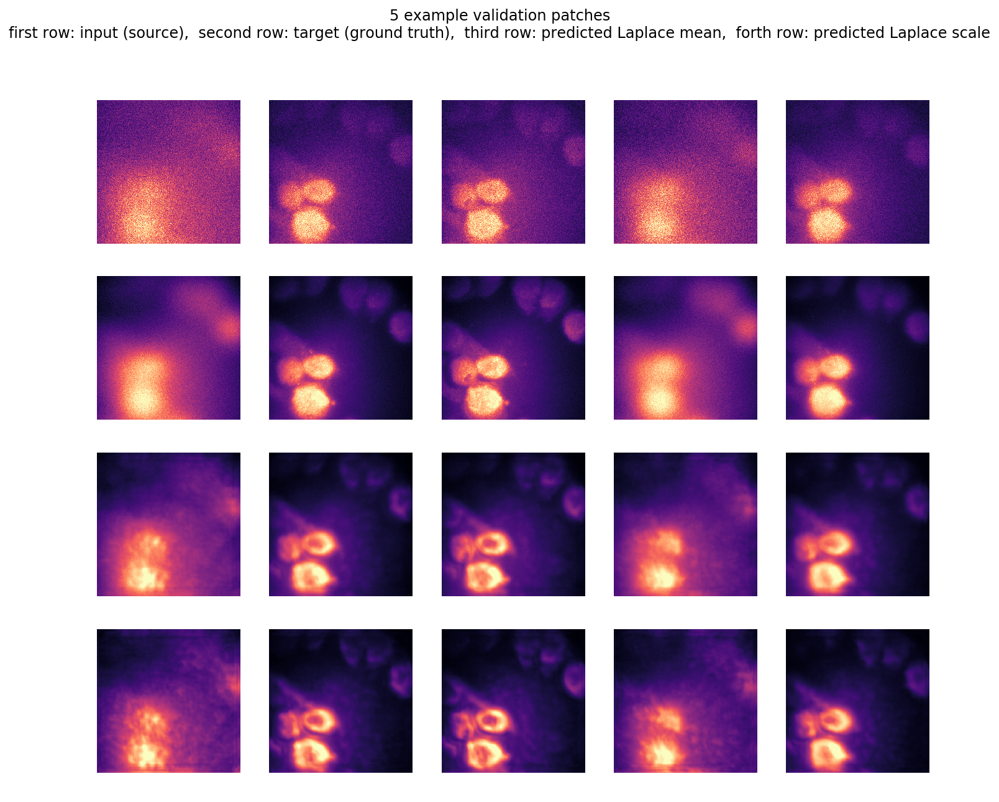

In [26]:
#CHANNEL 1
plt.figure(figsize=(12,10))
_P = hn_model_1.keras_model.predict(X_VAL_ALL_C[0][:5])
_P_mean  = _P[...,:(_P.shape[-1]//2)]
_P_scale = _P[...,(_P.shape[-1]//2):]
plot_some(X_VAL_ALL_C[0][:5],Y_VAL_ALL_C[0][:5],_P_mean,_P_scale,pmax=99.5)
plt.suptitle('5 example validation patches\n'      
             'first row: input (source),  '        
             'second row: target (ground truth),  '
             'third row: predicted Laplace mean,  '
             'forth row: predicted Laplace scale');

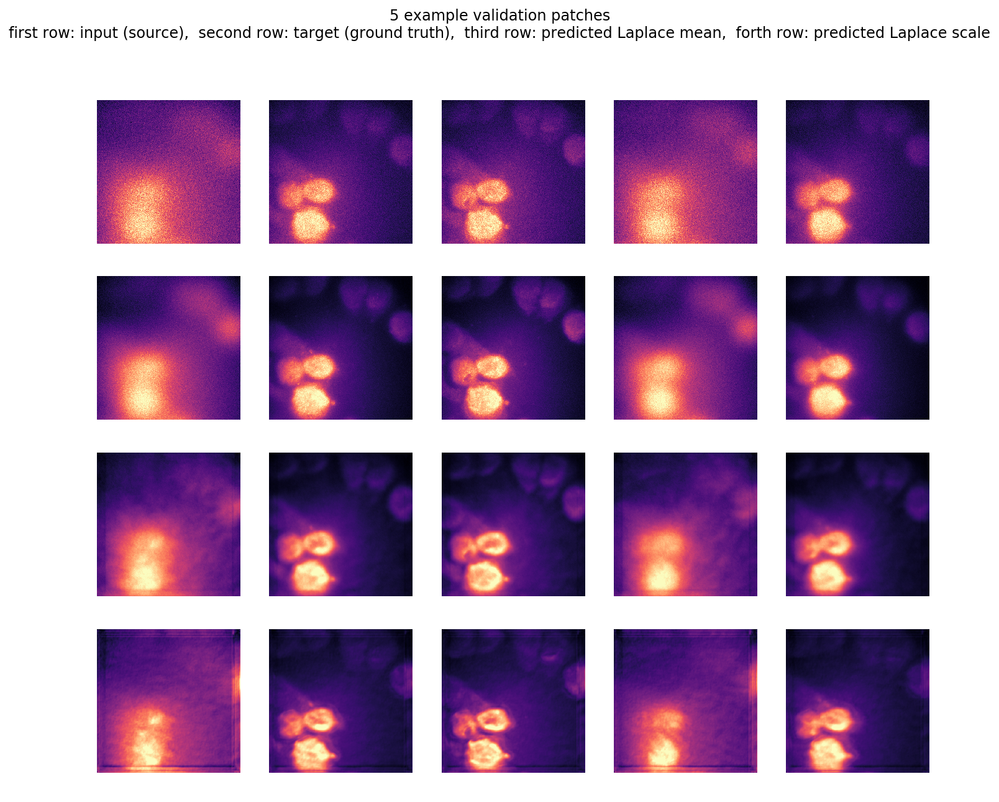

In [27]:
#CHANNEL 2
plt.figure(figsize=(12,10))
_P = hn_model_2.keras_model.predict(X_VAL_ALL_C[1][:5])
_P_mean  = _P[...,:(_P.shape[-1]//2)]
_P_scale = _P[...,(_P.shape[-1]//2):]
plot_some(X_VAL_ALL_C[1][:5],Y_VAL_ALL_C[1][:5],_P_mean,_P_scale,pmax=99.5)
plt.suptitle('5 example validation patches\n'      
             'first row: input (source),  '        
             'second row: target (ground truth),  '
             'third row: predicted Laplace mean,  '
             'forth row: predicted Laplace scale');

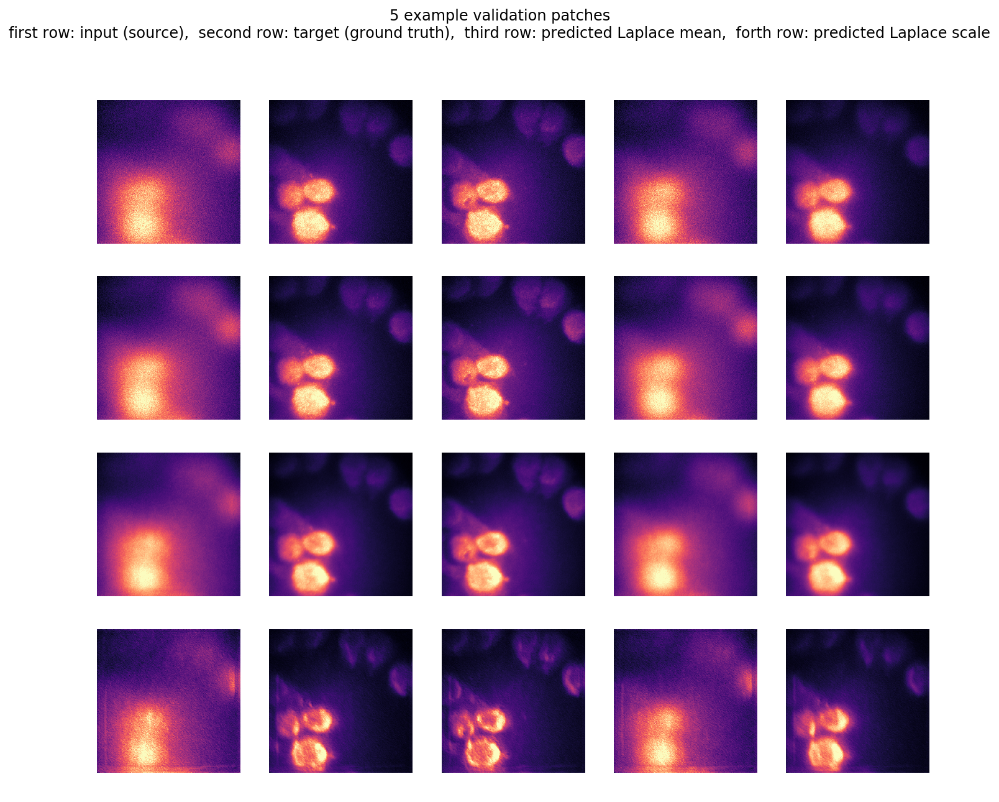

In [28]:
#CHANNEL 3
plt.figure(figsize=(12,10))
_P = hn_model_3.keras_model.predict(X_VAL_ALL_C[2][:5])
_P_mean  = _P[...,:(_P.shape[-1]//2)]
_P_scale = _P[...,(_P.shape[-1]//2):]
plot_some(X_VAL_ALL_C[2][:5],Y_VAL_ALL_C[2][:5],_P_mean,_P_scale,pmax=99.5)
plt.suptitle('5 example validation patches\n'      
             'first row: input (source),  '        
             'second row: target (ground truth),  '
             'third row: predicted Laplace mean,  '
             'forth row: predicted Laplace scale');

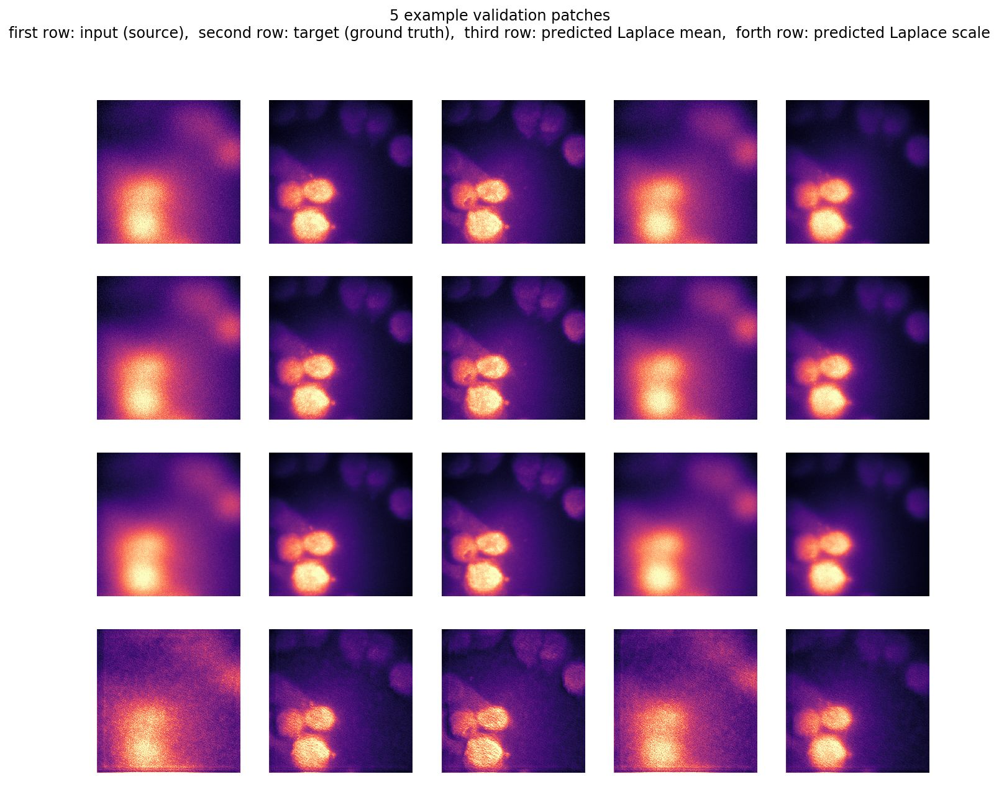

In [29]:
#CHANNEL 4
plt.figure(figsize=(12,10))
_P = hn_model_4.keras_model.predict(X_VAL_ALL_C[3][:5])
_P_mean  = _P[...,:(_P.shape[-1]//2)]
_P_scale = _P[...,(_P.shape[-1]//2):]
plot_some(X_VAL_ALL_C[3][:5],Y_VAL_ALL_C[3][:5],_P_mean,_P_scale,pmax=99.5)
plt.suptitle('5 example validation patches\n'      
             'first row: input (source),  '        
             'second row: target (ground truth),  '
             'third row: predicted Laplace mean,  '
             'forth row: predicted Laplace scale');

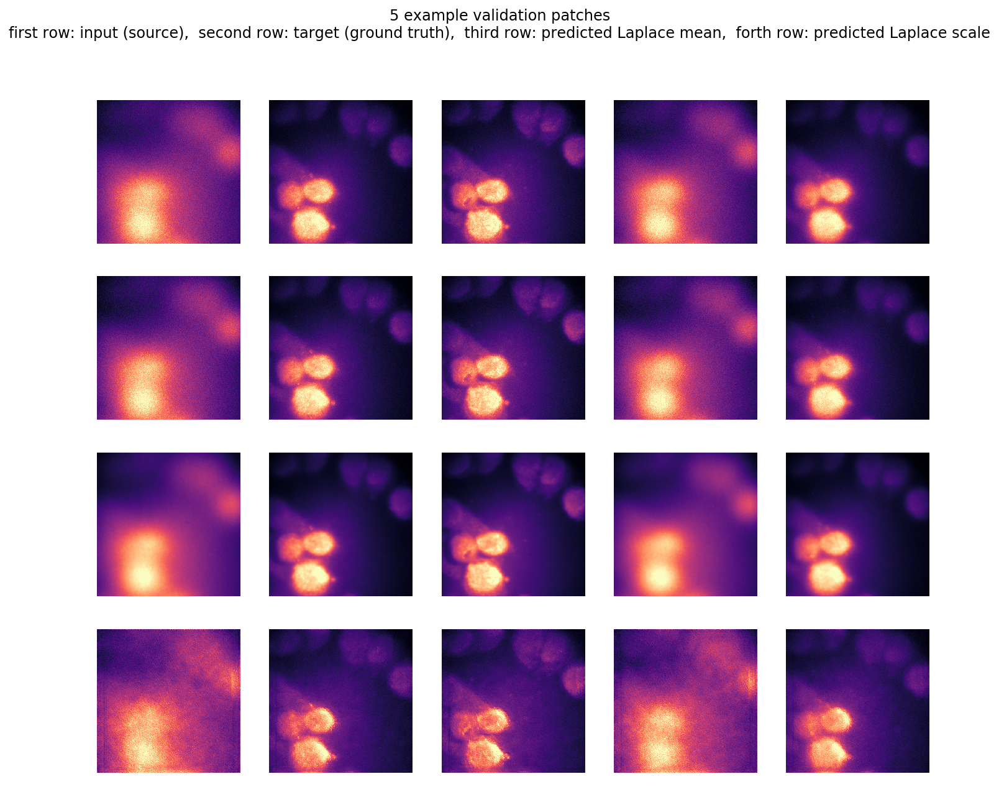

In [30]:
#CHANNEL 5
plt.figure(figsize=(12,10))
_P = hn_model_5.keras_model.predict(X_VAL_ALL_C[4][:5])
_P_mean  = _P[...,:(_P.shape[-1]//2)]
_P_scale = _P[...,(_P.shape[-1]//2):]
plot_some(X_VAL_ALL_C[4][:5],Y_VAL_ALL_C[4][:5],_P_mean,_P_scale,pmax=99.5)
plt.suptitle('5 example validation patches\n'      
             'first row: input (source),  '        
             'second row: target (ground truth),  '
             'third row: predicted Laplace mean,  '
             'forth row: predicted Laplace scale');

In [18]:
#VAL PREDICTIONS
#image by image predictions -- predict for every image in data set
    
        
HN_MODEL_VAL_PREDS_1 = hn_model_1.keras_model.predict(X_VAL_ALL_C[0])
HN_MODEL_VAL_PREDS_2 = hn_model_2.keras_model.predict(X_VAL_ALL_C[1])
HN_MODEL_VAL_PREDS_3 = hn_model_3.keras_model.predict(X_VAL_ALL_C[2])
HN_MODEL_VAL_PREDS_4 = hn_model_4.keras_model.predict(X_VAL_ALL_C[3])
HN_MODEL_VAL_PREDS_5 = hn_model_5.keras_model.predict(X_VAL_ALL_C[4])



In [19]:
HN_MODEL_VAL_PREDS = [HN_MODEL_VAL_PREDS_1,
                     HN_MODEL_VAL_PREDS_2,
                     HN_MODEL_VAL_PREDS_3,
                     HN_MODEL_VAL_PREDS_4,
                     HN_MODEL_VAL_PREDS_5]

In [20]:
from skimage.measure import compare_mse

#For predictions -- 
# VAL_PRED[i,...,0] --> 0 is the mean Laplace, 
# VAL_PRED[i,...,1] --> 1 is the scaled Laplace

VAL_SSIM_ACTUALS_ALL_C = []
VAL_SSIM_PREDS_ALL_C = []

VAL_MSE_ACTUALS_ALL_C = []
VAL_MSE_PREDS_ALL_C = []


for c in range(0,5):
    VAL_SSIM_ACTUALS = []
    VAL_SSIM_PREDS = []
    
    VAL_MSE_ACTUALS = []
    VAL_MSE_PREDS = []
    
    for i in range(0,len(X_VAL_ALL_C[c])):
        #SSIM training to target
        ssim_actual = ssim(X_VAL_ALL_C[c][i,...,0], Y_VAL_ALL_C[c][i,...,0],
                       win_size=None,multichannel=True)
        VAL_SSIM_ACTUALS.append(ssim_actual)

        #SSIM prediction to target
        ssim_pred = ssim(HN_MODEL_VAL_PREDS[c][i,...,0], Y_VAL_ALL_C[c][i,...,0],
                     win_size=None,multichannel=True)
        VAL_SSIM_PREDS.append(ssim_pred)
        
        
        
        #MSE training to target
        mse_actual = compare_mse(X_VAL_ALL_C[c][i,...,0], Y_VAL_ALL_C[c][i,...,0])
        VAL_MSE_ACTUALS.append(mse_actual)
        
        #MSE prediction to target
        mse_pred = compare_mse(HN_MODEL_VAL_PREDS[c][i,...,0], Y_VAL_ALL_C[c][i,...,0])
        VAL_MSE_PREDS.append(mse_pred)

    VAL_SSIM_ACTUALS_ALL_C.append(VAL_SSIM_ACTUALS)
    VAL_SSIM_PREDS_ALL_C.append(VAL_SSIM_PREDS)
    VAL_MSE_ACTUALS_ALL_C.append(VAL_MSE_ACTUALS)
    VAL_MSE_PREDS_ALL_C.append(VAL_MSE_PREDS)
    

/gpfs/share/skynet/apps/anaconda3/envs/tensorflow-env/lib/python3.6/site-packages/skimage/measure/_structural_similarity.py:149: UserWarning: Inputs have mismatched dtype.  Setting data_range based on X.dtype.
  warn("Inputs have mismatched dtype.  Setting data_range based on "


In [35]:
X_VAL_ALL_C[0][0,...,0]

array([[203, 185, 161, ..., 145, 157, 162],
       [142, 158, 119, ..., 191, 199, 147],
       [153, 149, 133, ..., 125, 143, 221],
       ...,
       [277, 167, 233, ..., 163, 181, 265],
       [214, 279, 282, ..., 259, 202, 193],
       [255, 175, 225, ..., 245, 129, 263]], dtype=uint16)

In [50]:
from skimage import img_as_uint, img_as_int, img_as_float

#For predictions -- 
# VAL_PRED[i,...,0] --> 0 is the mean Laplace, 
# VAL_PRED[i,...,1] --> 1 is the scaled Laplace


VAL_SSIM_PREDS_ALL_C = []
VAL_MSE_PREDS_ALL_C = []


for c in range(0,5):

    VAL_SSIM_PREDS = []
    
    VAL_MSE_PREDS = []
    
    for i in range(0,len(X_VAL_ALL_C[c])):
        #get range
        _min = Y_VAL_ALL_C[c][i,...,0].min()
        _max = Y_VAL_ALL_C[c][i,...,0].max()
        
        #SSIM prediction to target
        ssim_pred = ssim(HN_MODEL_VAL_PREDS[c][i,...,0], 
                         Y_VAL_ALL_C[c][i,...,0],
                         data_range = _max-_min,
                         win_size=None,
                         multichannel=True)
        VAL_SSIM_PREDS.append(ssim_pred)
        
        
        #MSE prediction to target
        mse_pred = compare_mse(HN_MODEL_VAL_PREDS[c][i,...,0], Y_VAL_ALL_C[c][i,...,0])
        VAL_MSE_PREDS.append(mse_pred)
        
      
    print("Channel "+str(c)+str(" ")+str(VAL_SSIM_PREDS))
    VAL_SSIM_PREDS_ALL_C.append(VAL_SSIM_PREDS)
    VAL_MSE_PREDS_ALL_C.append(VAL_MSE_PREDS)
    

Channel 0 [0.5320399043520019, 0.8319633794521273, 0.795716088066435, 0.5675180110967446, 0.8484510467338526, 0.8139878555427195, 0.5726907569842181, 0.7013790048035486, 0.8721027567968006, 0.8338617044127272, 0.6153680794384069, 0.8211813881362208, 0.794274702753451, 0.8964449302450365, 0.8956445537875768, 0.8649389304194752, 0.8815847724520358, 0.7448663668163354, 0.8349227328534048, 0.8587159937687905, 0.857447391309535, 0.8230988679340279, 0.5811397569090796, 0.7811927881152837, 0.876335885315408, 0.778393323213004, 0.8259838744355306, 0.7953252378886744, 0.5576488356425415, 0.838196606832178, 0.8238152002898209, 0.6518058401477345, 0.733465015189272, 0.812162621288891, 0.7672501273724159, 0.7289893797163596, 0.5431902276304263, 0.6669423993670391, 0.6412143044921312, 0.889253472631867, 0.8279601841417026, 0.893634660113004, 0.5900623852697644, 0.8101164406230581, 0.609114540561573, 0.885046735118342, 0.6255586209237426, 0.5318673871325146, 0.8369001136108228, 0.8692989993898883, 0

Channel 1 [0.5299664491761422, 0.8337928183393655, 0.8023836500153725, 0.5720601581632938, 0.8490524637473105, 0.8209724761344539, 0.5725782390304814, 0.7045893699435986, 0.8726153950087485, 0.8361670781397044, 0.6139393482230084, 0.8228152415213081, 0.803377565686868, 0.8938885152688133, 0.8942840805321215, 0.8642854721141967, 0.879129434622407, 0.7497616730448924, 0.8403670709961877, 0.8573550583179386, 0.8568730015038788, 0.8310673127772177, 0.5790002077047396, 0.7880955745359419, 0.8738768306203983, 0.7834994748653148, 0.8313255097063261, 0.802869605022328, 0.5634550445988418, 0.8385099660037307, 0.8305978437371732, 0.6543757306897228, 0.741124773175456, 0.8246328371025871, 0.7701597779989815, 0.7306416522620791, 0.5456368003316919, 0.6681618896923354, 0.6411297986893851, 0.8905779037563817, 0.8275879906141064, 0.8904207057209047, 0.5927438143529894, 0.8174728184056614, 0.6090011200523169, 0.8849954931787072, 0.6262918858130284, 0.5297367339990056, 0.8408131502019719, 0.86710731380

Channel 2 [0.5241427859915362, 0.8412772506863118, 0.8119334618915752, 0.5666674357440421, 0.8561931862498487, 0.8300932477594964, 0.5657234316807039, 0.70619712989403, 0.8771544059766482, 0.8437056596516745, 0.6088570323895417, 0.832304890456866, 0.8113620689915657, 0.8999505716203798, 0.8993400574257013, 0.8671654769324796, 0.8846242514498613, 0.7571745779638172, 0.8500132425188849, 0.8625213362012943, 0.8615750098103936, 0.8396158188609854, 0.5751678721887188, 0.7968407273213698, 0.8793231018438612, 0.7924200806527621, 0.8405502980594909, 0.8115000777080172, 0.5575064544429473, 0.8486081653665984, 0.8399280539653188, 0.6508912343181732, 0.7473027595837851, 0.8350359970520788, 0.7770807159307558, 0.7323566409227211, 0.5399546052196958, 0.6656809133619228, 0.636857900888249, 0.8950255104005279, 0.8384648277976012, 0.8959979112904807, 0.5872687331299173, 0.826610045292089, 0.6062657177467498, 0.8915016075172908, 0.6251048624125917, 0.5259884237778425, 0.8493689957181425, 0.873899624142

Channel 3 [0.49557235531723415, 0.8320519866227264, 0.8026881524322134, 0.5398372437658194, 0.8469870588688568, 0.8215994385935388, 0.5380735924849313, 0.6857103289035101, 0.8665309101569089, 0.8360900394317052, 0.5841760355334876, 0.8234333847016567, 0.8011940366026138, 0.8911098589218251, 0.8903209873136034, 0.8542087716262987, 0.8737001492217851, 0.74309212840034, 0.8412826320126316, 0.8515265200485407, 0.8503185511008295, 0.829785018439349, 0.5454829091032672, 0.7851296284539738, 0.8686676788465062, 0.7812858401753803, 0.8326069518246915, 0.801896151786361, 0.5290348891502696, 0.840167911345999, 0.8312559331665297, 0.6266782296558269, 0.7303644222248796, 0.8262127893590181, 0.7644084077564388, 0.7116240071655543, 0.5094789281045593, 0.6412445625090362, 0.6118268814441861, 0.886331320910094, 0.8279898619860644, 0.8866848600381854, 0.5603635071155866, 0.8178853024524768, 0.5791333673606511, 0.8825378939959843, 0.5998421130329794, 0.4989024473164527, 0.8412891855373801, 0.863192239360

Channel 4 [0.5614005430138392, 0.8576500801608017, 0.8319203713134216, 0.6030811585337462, 0.8705515231807224, 0.8480668610518444, 0.6017749855734911, 0.7355510274901186, 0.8912697663283712, 0.860092224283045, 0.6423216269272867, 0.8496796562504474, 0.8310167358198018, 0.9109773424286678, 0.9104962364107949, 0.8823473339722427, 0.8965891171582573, 0.7810246971767063, 0.8644841063741837, 0.8777058653079305, 0.8766837217418363, 0.8557462225896444, 0.6100443413902457, 0.8174212205503247, 0.892617263154077, 0.8139520390326638, 0.8575613309808472, 0.8307732994063398, 0.5947798622679357, 0.8641059792403206, 0.8565299576691113, 0.6832494793164559, 0.7718016782406237, 0.8519193368564935, 0.7992089099982409, 0.7586698506871083, 0.5770860752287285, 0.6961491441186398, 0.6693409925397327, 0.9070211631143968, 0.8542573469657623, 0.9071466495789117, 0.6242232509001858, 0.8442799443048037, 0.6404109109326029, 0.9039798597676287, 0.6580171057754349, 0.562549835170156, 0.863791520421753, 0.88830420969

In [51]:
#mean SSIMs for each channel
VAL_SSIM_ACTUALS_ALL_C_means = []
VAL_SSIM_PREDS_ALL_C_means = []

#mean MSEs for each channel
VAL_MSE_ACTUALS_ALL_C_means = []
VAL_MSE_PREDS_ALL_C_means = []


for c in range(0,5):
    VAL_SSIM_ACTUALS_mean = np.array(VAL_SSIM_ACTUALS_ALL_C[c]).mean()
    VAL_SSIM_ACTUALS_ALL_C_means.append(VAL_SSIM_ACTUALS_mean)
    
    VAL_SSIM_PREDS_mean = np.array(VAL_SSIM_PREDS_ALL_C[c]).mean()
    VAL_SSIM_PREDS_ALL_C_means.append(VAL_SSIM_PREDS_mean)
    
    VAL_MSE_ACTUALS_mean = np.array(VAL_MSE_ACTUALS_ALL_C[c]).mean()
    VAL_MSE_ACTUALS_ALL_C_means.append(VAL_MSE_ACTUALS_mean)
    
    VAL_MSE_PREDS_mean = np.array(VAL_MSE_PREDS_ALL_C[c]).mean()
    VAL_MSE_PREDS_ALL_C_means.append(VAL_MSE_PREDS_mean)



In [56]:
#STD SSIMs for each channel
VAL_SSIM_ACTUALS_ALL_C_stds = []
VAL_SSIM_PREDS_ALL_C_stds = []

#STD MSEs for each channel
VAL_MSE_ACTUALS_ALL_C_stds = []
VAL_MSE_PREDS_ALL_C_stds = []


for c in range(0,5):
    VAL_SSIM_ACTUALS_std = np.array(VAL_SSIM_ACTUALS_ALL_C[c]).std()
    VAL_SSIM_ACTUALS_ALL_C_stds.append(VAL_SSIM_ACTUALS_std)
    
    VAL_SSIM_PREDS_mean = np.array(VAL_SSIM_PREDS_ALL_C[c]).std()
    VAL_SSIM_PREDS_ALL_C_stds.append(VAL_SSIM_PREDS_mean)
    
    VAL_MSE_ACTUALS_std = np.array(VAL_MSE_ACTUALS_ALL_C[c]).std()
    VAL_MSE_ACTUALS_ALL_C_stds.append(VAL_MSE_ACTUALS_std)
    
    VAL_MSE_PREDS_std = np.array(VAL_MSE_PREDS_ALL_C[c]).std()
    VAL_MSE_PREDS_ALL_C_stds.append(VAL_MSE_PREDS_std)


In [55]:
for c in range(0,5):
    #SSIMs
    print("Validation SSIM Training Mean - Channel "+str(c)+": " + str(VAL_SSIM_ACTUALS_ALL_C_means[c]))
    print("Validation SSIM Predictions Mean - Channel "+str(c)+": " + str(VAL_SSIM_PREDS_ALL_C_means[c]))
    #MSEs
    #print("Validation MSE Training Mean - Channel "+str(c)+": " + str(VAL_MSE_ACTUALS_ALL_C_means[c]))
    #print("Validation MSE Predictions Mean - Channel "+str(c)+": " + str(VAL_MSE_PREDS_ALL_C_means[c]))


Validation SSIM Training Mean - Channel 0: 0.3489214022884552
Validation SSIM Predictions Mean - Channel 0: 0.751355296611922
Validation SSIM Training Mean - Channel 1: 0.4202242145588947
Validation SSIM Predictions Mean - Channel 1: 0.7532057367602636
Validation SSIM Training Mean - Channel 2: 0.8177391190510567
Validation SSIM Predictions Mean - Channel 2: 0.7542099958292274
Validation SSIM Training Mean - Channel 3: 0.9601026392740539
Validation SSIM Predictions Mean - Channel 3: 0.7387056840176176
Validation SSIM Training Mean - Channel 4: 0.9820474959384303
Validation SSIM Predictions Mean - Channel 4: 0.7775823303622731


In [57]:
for c in range(0,5):
    #SSIMs
    print("Validation SSIM Training std - Channel "+str(c)+": " + str(VAL_SSIM_ACTUALS_ALL_C_stds[c]))
    print("Validation SSIM Predictions std - Channel "+str(c)+": " + str(VAL_SSIM_PREDS_ALL_C_stds[c]))
    #MSEs
    #print("Validation MSE Training Mean - Channel "+str(c)+": " + str(VAL_MSE_ACTUALS_ALL_C_means[c]))
    #print("Validation MSE Predictions Mean - Channel "+str(c)+": " + str(VAL_MSE_PREDS_ALL_C_means[c]))


Validation SSIM Training std - Channel 0: 0.03821859077537077
Validation SSIM Predictions std - Channel 0: 0.11761963080857822
Validation SSIM Training std - Channel 1: 0.03889634635606635
Validation SSIM Predictions std - Channel 1: 0.11843004808754468
Validation SSIM Training std - Channel 2: 0.019846158339038588
Validation SSIM Predictions std - Channel 2: 0.12365877298998579
Validation SSIM Training std - Channel 3: 0.007261661122038721
Validation SSIM Predictions std - Channel 3: 0.13157174739780264
Validation SSIM Training std - Channel 4: 0.0033975800058997615
Validation SSIM Predictions std - Channel 4: 0.1150815223608618


In [75]:
VAL_MSE_PREDS_ALL_C_means[0:5]

[375116.2330779352,
 349359.50445999287,
 125043.22599983933,
 76482.24085205168,
 43580.904751109294]

### Colin's plotting functions

In [70]:
orig_ssim = np.array([0.3489214022884552,
 0.4202242145588947,
 0.8177391190510567,
 0.9601026392740539,
 0.9820474959384303])

orig_ssim_stdev = np.array([
0.03821859077537077,
 0.03889634635606635,
 0.019846158339038588,
 0.007261661122038721,
 0.0033975800058997615
])

In [71]:
model_ssim = np.array([0.751355296611922,
 0.7532057367602636,
 0.7542099958292274,
 0.7387056840176176,
 0.7775823303622731])
model_ssim_stdev = np.array([0.11761963080857822,
 0.11843004808754468,
 0.12365877298998579,
 0.13157174739780264,
 0.1150815223608618])

In [72]:
orig_nmse = np.array([12016643.80871186,
 11118441.692571389,
 3869115.3430569307,
 739955.4616577275,
 121633.49924449687])

orig_nmse_stdev = np.array([
7020342.001872707,
 6603817.5476468755,
 2353299.6545576253,
 454378.3752186192,
 64802.85208560507
])

In [73]:
model_nmse = np.array([375116.2330779352,
 349359.50445999287,
 125043.22599983933,
 76482.24085205168,
 43580.904751109294])
model_nmse_stdev = np.array([326783.08008512936,
 337087.04735320003,
 98311.79282906599,
 45814.46185306836,
 19996.50454135351])

Text(0.5, 0, 'Channel (larger number -> higher laser intensity)')

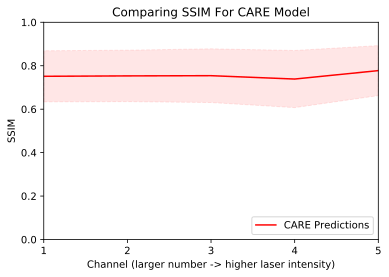

In [86]:
%config InlineBackend.figure_format = 'svg'

# Comparing SSIM for denoising
#plt.plot(list(range(1, 6)), orig_ssim, label="No Transformation", color='blue') 
plt.plot(list(range(1, 6)), model_ssim , label="CARE Predictions", color='red')

#plt.fill_between(list(range(1, 6)), orig_ssim + orig_ssim_stdev, orig_ssim -orig_ssim_stdev, 
#                 color="blue", linestyle="--", alpha=0.1)

plt.fill_between(list(range(1, 6)), model_ssim + model_ssim_stdev, model_ssim -model_ssim_stdev, 
                 color="red", linestyle="--", alpha=0.1)



plt.title('Comparing SSIM For CARE Model')
plt.legend(loc = 'lower right')

plt.xlim([1, 5])
plt.ylim([0,1])
plt.axes().set_xticks(list(range(1, 6)), minor=False)

plt.ylabel('SSIM')
plt.xlabel('Channel (larger number -> higher laser intensity)')

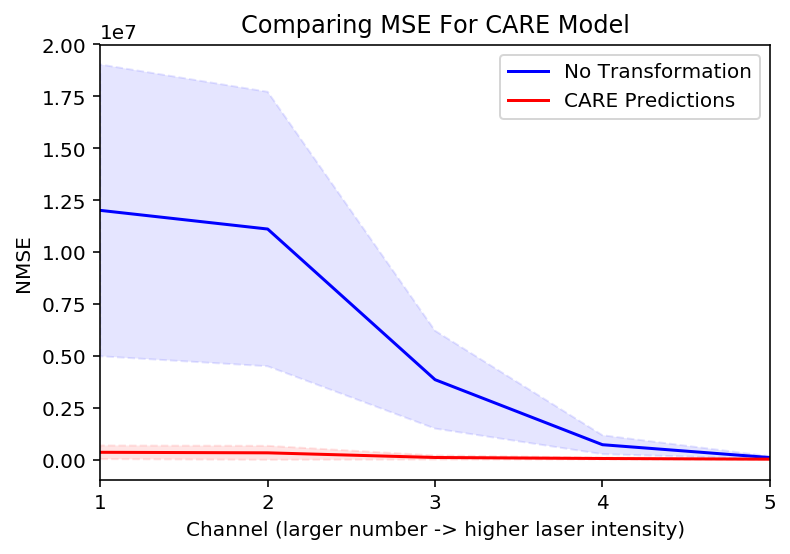

In [81]:
# Comparing MSE for denoising
plt.plot(list(range(1, 6)), orig_nmse, label="No Transformation", color='blue') 
plt.plot(list(range(1, 6)), model_nmse , label="CARE Predictions", color='red') 

plt.fill_between(list(range(1, 6)), orig_nmse + orig_nmse_stdev, orig_nmse -orig_nmse_stdev, 
                 color="blue", linestyle="--", alpha=0.1)

plt.fill_between(list(range(1, 6)), model_nmse + model_nmse_stdev, model_nmse -model_nmse_stdev, 
                 color="red", linestyle="--", alpha=0.1)


plt.title('Comparing MSE For CARE Model')
plt.legend(loc = 'upper right')

plt.xlim([1, 5])
plt.axes().set_xticks(list(range(1, 6)), minor=False)

plt.ylabel('NMSE')
plt.xlabel('Channel (larger number -> higher laser intensity)')
plt.show()

## Additional Testing Data Set

In [ ]:
#TESTING DATA -- RUN AFTER MODEL IS COMPLETE
#X test
X_TEST_ALL_C = []
for c in range(0,5):
    X_TEST = []
    for i in range(0,len(X_TEST_SETS[c])):
        image = exposure.rescale_intensity(X_TEST_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        X_TEST.append(image)
    X_TEST = np.array(X_TEST)
    X_TEST_ALL_C.append(X_TEST)
    
#Y test
Y_TEST_ALL_C = []
for c in range(0,5):
    Y_TEST = []
    for i in range(0,len(Y_TEST_SETS[c])):
        image = exposure.rescale_intensity(Y_TEST_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        Y_TEST.append(image)
    Y_TEST = np.array(Y_TEST)
    Y_TEST_ALL_C.append(Y_TEST)
    
for c in range(0,5):
    X_TEST_ALL_C[c] = X_TEST_ALL_C[c].reshape(len(X_TEST_ALL_C[c]), 512, 512,1)
    Y_TEST_ALL_C[c] = Y_TEST_ALL_C[c].reshape(len(Y_TEST_ALL_C[c]), 512, 512,1)

In [ ]:
#TEST PREDICTIONS
HN_MODEL_TEST_PREDS_1 = hn_model_1.keras_model.predict(X_TEST_ALL_C[0])
HN_MODEL_TEST_PREDS_2 = hn_model_2.keras_model.predict(X_TEST_ALL_C[1])
HN_MODEL_TEST_PREDS_3 = hn_model_3.keras_model.predict(X_TEST_ALL_C[2])
HN_MODEL_TEST_PREDS_4 = hn_model_4.keras_model.predict(X_TEST_ALL_C[3])
HN_MODEL_TEST_PREDS_5 = hn_model_5.keras_model.predict(X_TEST_ALL_C[4])

In [ ]:

HN_MODEL_TEST_PREDS = [HN_MODEL_TEST_PREDS_1,
                      HN_MODEL_TEST_PREDS_2,
                      HN_MODEL_TEST_PREDS_3,
                      HN_MODEL_TEST_PREDS_4,
                      HN_MODEL_TEST_PREDS_5]

In [ ]:
#For predictions -- 
# VAL_PRED[i,...,0] --> 0 is the mean Laplace, 
# VAL_PRED[i,...,1] --> 1 is the scaled Laplace

TEST_SSIM_ACTUALS_ALL_C = []
TEST_SSIM_PREDS_ALL_C = []

for c in range(0,5):
    TEST_SSIM_ACTUALS = []
    TEST_SSIM_PREDS = []
    for i in range(0,len(X_TEST_ALL_C[c])):
        #SSIM training to target
        ssim_actual = ssim(X_TEST_ALL_C[c][i,...,0], Y_VAL_TEST_C[c][i,...,0],
                       win_size=None,multichannel=True)
        TEST_SSIM_ACTUALS.append(ssim_actual)

        #SSIM prediction to target
        ssim_pred = ssim(HN_MODEL_TEST_PREDS[c][i,...,0], Y_TEST_ALL_C[c][i,...,0],
                     win_size=None,multichannel=True)
        TEST_SSIM_PREDS.append(ssim_pred)
      
    TEST_SSIM_ACTUALS_ALL_C.append(TEST_SSIM_ACTUALS)
    TEST_SSIM_PREDS_ALL_C.append(TEST_SSIM_PREDS)

In [ ]:
TEST_SSIM_ACTUALS_ALL_C_means = []
TEST_SSIM_PREDS_ALL_C_means = []

for c in range(0,5):
    TEST_SSIM_ACTUALS_mean = np.array(TEST_SSIM_ACTUALS_ALL_C[c]).mean()
    TEST_SSIM_ACTUALS_ALL_C_means.append(TEST_SSIM_ACTUALS_mean)
    
    TEST_SSIM_PREDS_mean = np.array(TEST_SSIM_PREDS_ALL_C[c]).mean()
    TEST_SSIM_PREDS_ALL_C_means.append(TEST_SSIM_PREDS_mean)

In [ ]:
for c in range(0,5):
    print("Test SSIM Training Mean - Channel "+str(c)+": " + str(TEST_SSIM_ACTUALS_ALL_C_means[c]))
    print("Test SSIM Predictions Mean - Channel "+str(c)+": " + str(TEST_SSIM_PREDS_ALL_C_means[c]))


## Returning to Notebook -- must have train models prior to this

In [ ]:
#read in X val for each channel
X_VALIDATION_SETS = []
for c in range(0,5):  
    X_val = []
    for i in range(0,len(val_sets[c])):
        entry = skimage.external.tifffile.imread(val_sets[c][i][0])
        X_val.append(entry)
    X_val = np.array(X_val)
    X_VALIDATION_SETS.append(X_val)
    
#read in Y val for each channel
Y_VALIDATION_SETS = []
for c in range(0,5):  
    Y_val = []
    for i in range(0,len(val_sets[c])):
        entry = skimage.external.tifffile.imread(val_sets[c][i][1])
        Y_val.append(entry)
    Y_val = np.array(Y_val)
    Y_VALIDATION_SETS.append(Y_val)

In [ ]:
#Reload from history 
stack_max = 49222
stack_min = 65

In [ ]:
#JUST VALIDATION SETS -- use on second round
#X val
X_VAL_ALL_C = []
for c in range(0,5):
    X_VAL = []
    for i in range(0,len(X_VALIDATION_SETS[c])):
        image = exposure.rescale_intensity(X_VALIDATION_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        X_VAL.append(image)
    X_VAL = np.array(X_VAL)
    X_VAL_ALL_C.append(X_VAL)
    
#Y val
Y_VAL_ALL_C = []
for c in range(0,5):
    Y_VAL = []
    for i in range(0,len(Y_VALIDATION_SETS[c])):
        image = exposure.rescale_intensity(Y_VALIDATION_SETS[c][i],in_range=(stack_min,stack_max))
        #image = rescale(image, 1.0/4.0, anti_aliasing=False)
        Y_VAL.append(image)
    Y_VAL = np.array(Y_VAL)
    Y_VAL_ALL_C.append(Y_VAL)

In [ ]:
#reshape X and Y --> (3886, 128, 128) to (3886, 128, 128, 1)

for c in range(0,5):
    #X_TRAIN_ALL_C[c] = X_TRAIN_ALL_C[c].reshape(len(X_TRAIN_ALL_C[c]),512,512,1)
    X_VAL_ALL_C[c] = X_VAL_ALL_C[c].reshape(len(X_VAL_ALL_C[c]), 512, 512,1)
    #Y_TRAIN_ALL_C[c] = Y_TRAIN_ALL_C[c].reshape(len(Y_TRAIN_ALL_C[c]), 512, 512,1)
    Y_VAL_ALL_C[c] = Y_VAL_ALL_C[c].reshape(len(Y_VAL_ALL_C[c]), 512, 512,1)


In [ ]:
#model_1 = CARE(config=None, name='hn_model_1', basedir='models')
model_2 = CARE(config=None, name='hn_model_2', basedir='models')
model_3 = CARE(config=None, name='hn_model_3', basedir='models')
model_4 = CARE(config=None, name='hn_model_4', basedir='models')
model_5 = CARE(config=None, name='hn_model_5', basedir='models')

Loading network weights from 'weights_best.h5'.
Loading network weights from 'weights_best.h5'.
Loading network weights from 'weights_best.h5'.
Loading network weights from 'weights_best.h5'.


In [ ]:
#model_1_preds = model_1.keras_model.predict(X_VAL_ALL_C[0])
model_2_preds = model_2.keras_model.predict(X_VAL_ALL_C[0])
model_3_preds = model_3.keras_model.predict(X_VAL_ALL_C[0])
model_4_preds = model_4.keras_model.predict(X_VAL_ALL_C[0])
model_5_preds = model_5.keras_model.predict(X_VAL_ALL_C[0])

In [29]:
model_1_preds[600,...,0]

array([[ 336.89044,  399.2735 ,  527.2737 , ...,  602.25964,  542.2811 ,
         509.71387],
       [ 337.43912,  449.48447,  511.984  , ...,  549.953  ,  583.25024,
         573.3783 ],
       [ 442.1062 ,  430.66028,  461.8809 , ...,  642.80316,  534.2008 ,
         535.155  ],
       ...,
       [1839.5568 , 2077.599  , 2141.7773 , ..., 2786.9297 , 2520.099  ,
        2150.5786 ],
       [1632.9282 , 2045.2825 , 2064.6702 , ..., 2799.019  , 2433.8481 ,
        1981.1517 ],
       [1448.0304 , 1836.2802 , 1978.1268 , ..., 2590.167  , 2009.1235 ,
        1554.2325 ]], dtype=float32)

In [67]:
from skimage.measure import compare_mse, compare_nrmse

#For predictions -- 
# VAL_PRED[i,...,0] --> 0 is the mean Laplace, 
# VAL_PRED[i,...,1] --> 1 is the scaled Laplace


   
VAL_NRMSE_ACTUALS_C1 = []
VAL_NRMSE_PREDS_C1 = []

for i in range(0,len(X_VAL_ALL_C[0])):
    
    #MSE training to target
    mse_actual = compare_nrmse(X_VAL_ALL_C[0][i,...,0], Y_VAL_ALL_C[0][i,...,0])
    VAL_NRMSE_ACTUALS_C1.append(mse_actual)

    #MSE prediction to target
    mse_pred = compare_nrmse(model_1_preds[i,...,0], Y_VAL_ALL_C[0][i,...,0])
    VAL_NRMSE_PREDS_C1.append(mse_pred)




In [ ]:
from skimage.measure import compare_mse, compare_nrmse

#For predictions -- 
# VAL_PRED[i,...,0] --> 0 is the mean Laplace, 
# VAL_PRED[i,...,1] --> 1 is the scaled Laplace


VAL_NRMSE_PREDS_C2 = []
VAL_NRMSE_PREDS_C3 = []
VAL_NRMSE_PREDS_C4 = []
VAL_NRMSE_PREDS_C5 = []

for i in range(0,len(X_VAL_ALL_C[0])):

    #MSE prediction to target
    mse_pred = compare_nrmse(model_2_preds[i,...,0], Y_VAL_ALL_C[0][i,...,0])
    VAL_NRMSE_PREDS_C2.append(mse_pred)
    
    mse_pred = compare_nrmse(model_3_preds[i,...,0], Y_VAL_ALL_C[0][i,...,0])
    VAL_NRMSE_PREDS_C3.append(mse_pred)
    
    mse_pred = compare_nrmse(model_4_preds[i,...,0], Y_VAL_ALL_C[0][i,...,0])
    VAL_NRMSE_PREDS_C4.append(mse_pred)
    
    mse_pred = compare_nrmse(model_5_preds[i,...,0], Y_VAL_ALL_C[0][i,...,0])
    VAL_NRMSE_PREDS_C5.append(mse_pred)
    
    

In [68]:
np.array(VAL_NRMSE_ACTUALS_C1).mean()

9.226075589619256

In [69]:
np.array(VAL_NRMSE_PREDS_C1).mean()

0.16050278070677332

In [55]:
img_path = '/gpfs/data/lionnetlab/cellvision/pilotdata/20181009-top50/sample31_channel6_z9.tif'

image = skimage.external.tifffile.imread(img_path)
image_ = exposure.rescale_intensity(image,in_range=(stack_min,stack_max))

_image_ = image_.reshape(1,512,512,1)


In [48]:
cv_original

array([[ 312,  388,  416, ...,  399,  476,  467],
       [ 334,  397,  390, ...,  379,  457,  328],
       [ 404,  543,  418, ...,  358,  349,  347],
       ...,
       [2504, 2377, 2588, ...,  747,  672,  572],
       [2433, 2685, 2496, ...,  618,  559,  667],
       [2422, 2560, 2794, ...,  622,  696,  714]], dtype=uint16)

In [56]:
img_for_poster = model_1.keras_model.predict(_image_)


In [59]:
img_for_poster[0,...,0]

array([[ 1006.99347,  1384.3783 ,  1701.9384 , ...,  1920.7533 ,
         1791.8705 ,  1592.4371 ],
       [ 1276.8401 ,  1705.316  ,  2014.6428 , ...,  2058.5537 ,
         1991.9358 ,  1601.9539 ],
       [ 1660.5421 ,  2182.3435 ,  2251.604  , ...,  2211.8882 ,
         1948.5637 ,  1728.5759 ],
       ...,
       [27214.375  , 31332.781  , 32438.39   , ..., 10167.1455 ,
         8899.498  ,  7026.5947 ],
       [22793.492  , 29474.926  , 30543.113  , ...,  9873.8125 ,
         8372.74   ,  6609.807  ],
       [20018.924  , 25537.326  , 28787.166  , ...,  8990.135  ,
         7075.741  ,  5176.1807 ]], dtype=float32)

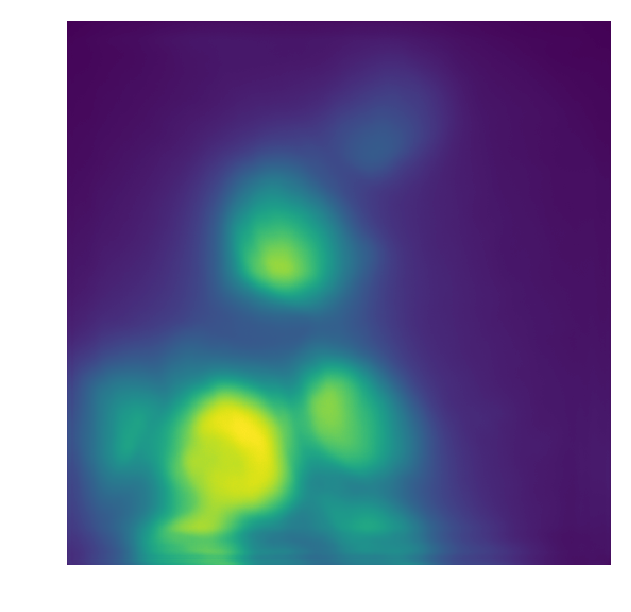

In [60]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(25,5))
ax.imshow(img_for_poster[0,...,0]);
ax.axis('off')
plt.show()

